In [1]:
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns

from pandas import set_option
# set_option("display.max_rows", 10)
pd.options.mode.chained_assignment = None

###### Import packages needed for the make_vars functions
from scipy.interpolate import interp1d
import pywt

filename = 'data/facies_vectors.csv'
training_data = pd.read_csv(filename)
training_data.head()

,Facies,Formation,Well Name,Depth,GR,ILD_log10,DeltaPHI,PHIND,PE,NM_M,RELPOS
0,3,A1 SH,SHRIMPLIN,2793.0,77.45,0.664,9.9,11.915,4.6,1,1.000
1,3,A1 SH,SHRIMPLIN,2793.5,78.26,0.661,14.2,12.565,4.1,1,0.979
2,3,A1 SH,SHRIMPLIN,2794.0,79.05,0.658,14.8,13.050,3.6,1,0.957
3,3,A1 SH,SHRIMPLIN,2794.5,86.10,0.655,13.9,13.115,3.5,1,0.936
4,3,A1 SH,SHRIMPLIN,2795.0,74.58,0.647,13.5,13.300,3.4,1,0.915


In [2]:
def make_dwt_vars_cA(wells_df,logs,levels,wavelet):

    wave= pywt.Wavelet(wavelet)
    max_level = max(levels)
    
    grouped = wells_df.groupby(['Well Name'])
    new_df = pd.DataFrame()
    for key in grouped.groups.keys():
    
        depth = grouped.get_group(key)['Depth']
        temp_df = pd.DataFrame()
        temp_df['Depth'] = depth
        for log in logs:
      
            temp_data = grouped.get_group(key)[log]
              
            for i in levels:
                
                    cA_cD = pywt.wavedec(temp_data,wave,level=i,mode='symmetric')
                    cA = cA_cD[0]
                    new_depth = np.linspace(min(depth),max(depth),len(cA))
                    fA = interp1d(new_depth,cA,kind='nearest')
                    #temp_df[log + '_cD_step_level_' + str(i)] = fD(depth)
                    temp_df[log + '_cA_level_' + str(i)] = fA(depth)
    
        temp_df['Well Name'] = [key for _ in range(len(depth))]
        new_df = new_df.append(temp_df)
        
    new_df = new_df.sort_index()
    new_df = new_df.drop(['Well Name','Depth'],axis=1)
    wells_df = wells_df[['Facies', 'Formation', 'Well Name', 'Depth']]
    return pd.concat([wells_df, new_df],axis=1)

In [6]:
##### cA From wavelet db3
dwt_db1_cA_df = make_dwt_vars_cA(wells_df=training_data, logs=['GR', 'ILD_log10', 'DeltaPHI', 'PE', 'PHIND'],
                       levels=[1, 2, 3, 4], wavelet='db1')
print (dwt_db1_cA_df.shape)
dwt_db1_cA_df.head(5)

(4149, 24)


,Facies,Formation,Well Name,Depth,GR_cA_level_1,GR_cA_level_2,GR_cA_level_3,GR_cA_level_4,ILD_log10_cA_level_1,ILD_log10_cA_level_2,...,DeltaPHI_cA_level_3,DeltaPHI_cA_level_4,PE_cA_level_1,PE_cA_level_2,PE_cA_level_3,PE_cA_level_4,PHIND_cA_level_1,PHIND_cA_level_2,PHIND_cA_level_3,PHIND_cA_level_4
0,3,A1 SH,SHRIMPLIN,2793.0,110.103597,160.43,218.771767,311.015,0.936916,1.319,...,39.739401,56.075,6.151829,7.9,10.606602,14.35,17.309974,25.3225,37.186746,54.84125
1,3,A1 SH,SHRIMPLIN,2793.5,110.103597,160.43,218.771767,311.015,0.936916,1.319,...,39.739401,56.075,6.151829,7.9,10.606602,14.35,17.309974,25.3225,37.186746,54.84125
2,3,A1 SH,SHRIMPLIN,2794.0,116.778685,160.43,218.771767,311.015,0.928431,1.319,...,39.739401,56.075,5.020458,7.9,10.606602,14.35,18.501449,25.3225,37.186746,54.84125
3,3,A1 SH,SHRIMPLIN,2794.5,116.778685,148.96,218.771767,311.015,0.928431,1.269,...,39.739401,56.075,5.020458,7.1,10.606602,14.35,18.501449,27.2675,37.186746,54.84125
4,3,A1 SH,SHRIMPLIN,2795.0,105.040712,148.96,218.771767,311.015,0.907218,1.269,...,39.739401,56.075,4.949747,7.1,10.606602,14.35,18.869144,27.2675,37.186746,54.84125


In [7]:
####### Creating dictionary of colours for the different facies
facies_colors = {1:'#F4D03F', 2:'#F5B041',3:'#DC7633',4:'#6E2C00',
       5:'#1B4F72',6:'#2E86C1', 7:'#AED6F1', 8:'#A569BD', 9:'#196F3D'}
facies_name = {1:'SS', 2:'CSiS',3:'FSiS',4:'SiSh', 5:'MS',6:'WS', 7:'D', 8:'PS', 9:'BS'}

flatui = ['#F4D03F', '#F5B041', '#DC7633', '#6E2C00',
       '#1B4F72', '#2E86C1', '#AED6F1', '#A569BD', '#196F3D']

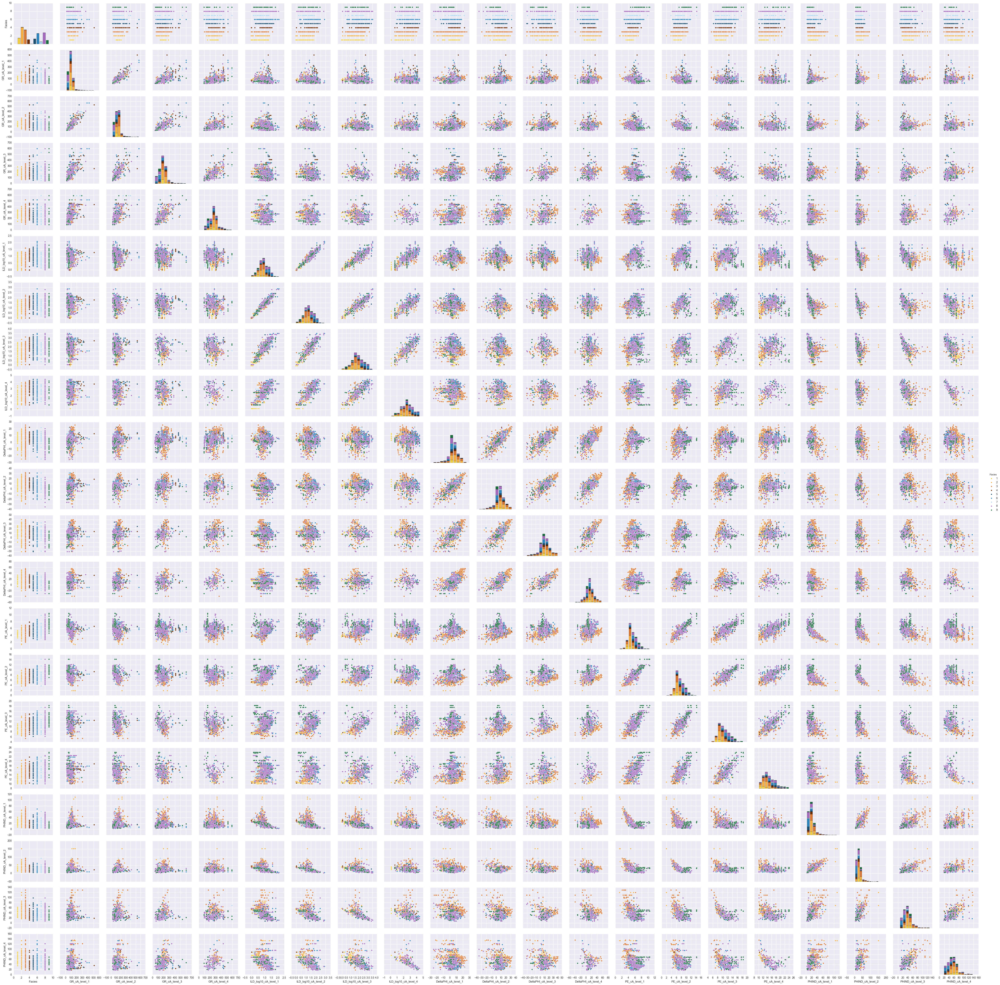

In [9]:
sns.set()
temp_df = dwt_db1_cA_df
temp_df = temp_df.drop(['Formation', 'Well Name', 'Depth'], axis=1)
temp_df.dropna(inplace=True)
sns.pairplot(temp_df, hue='Facies', palette = flatui)

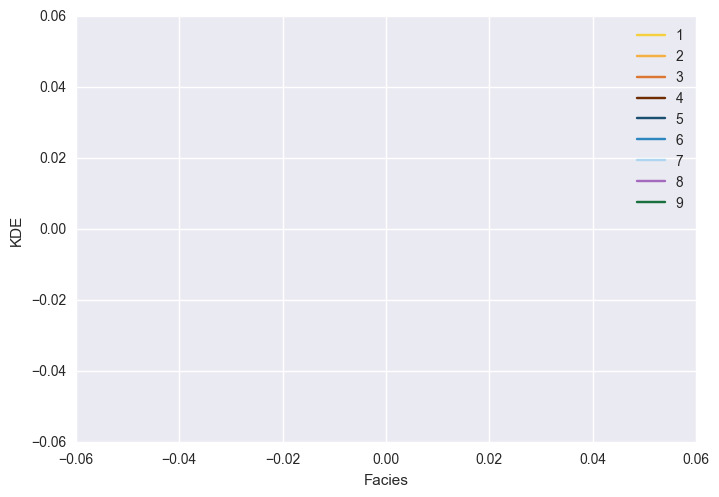

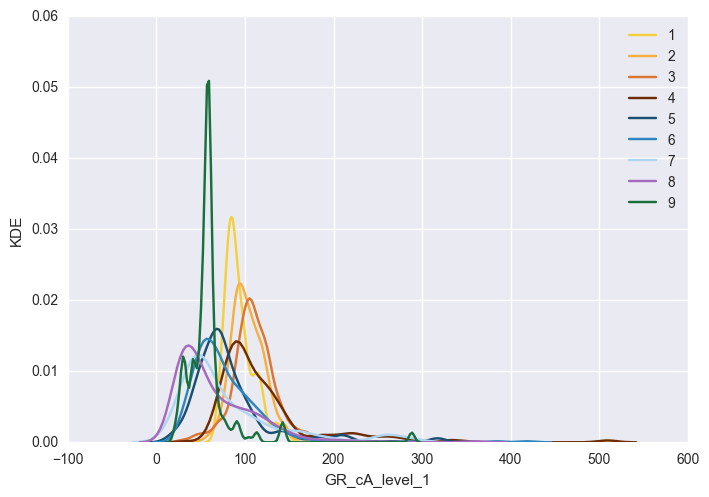

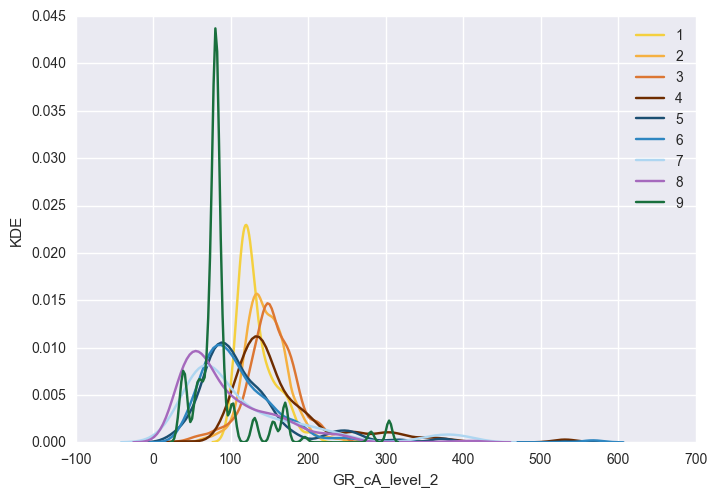

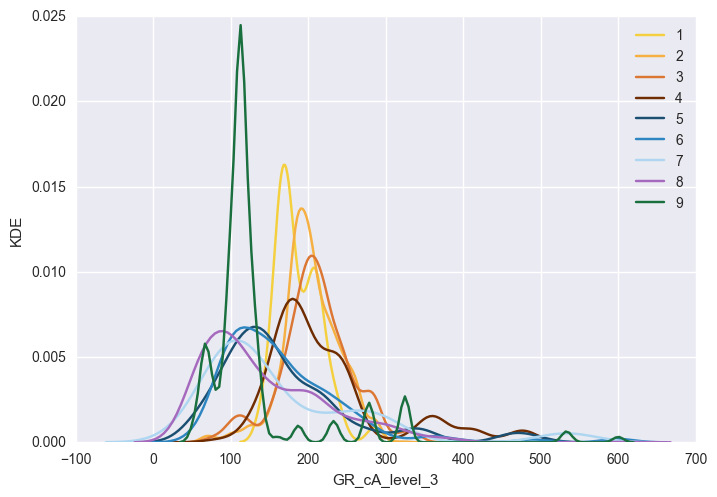

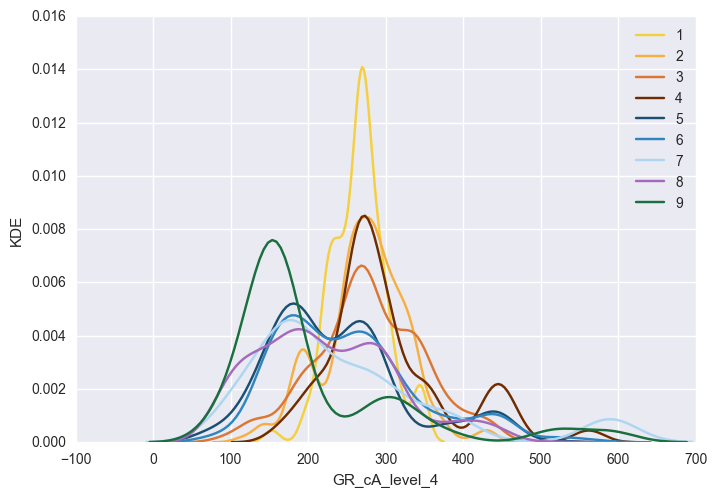

...

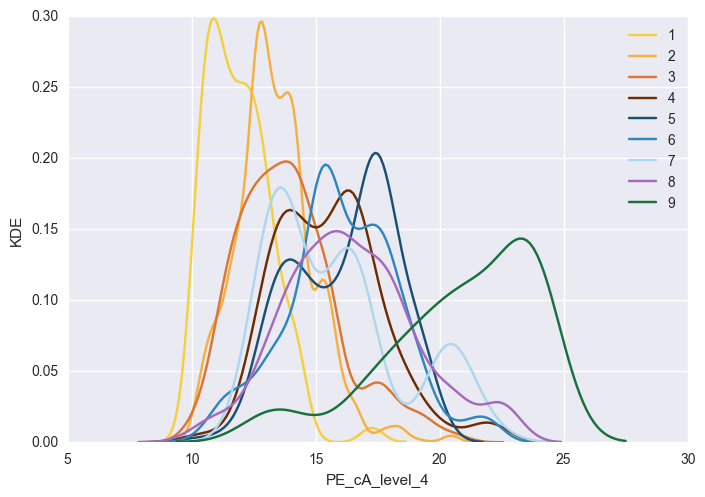

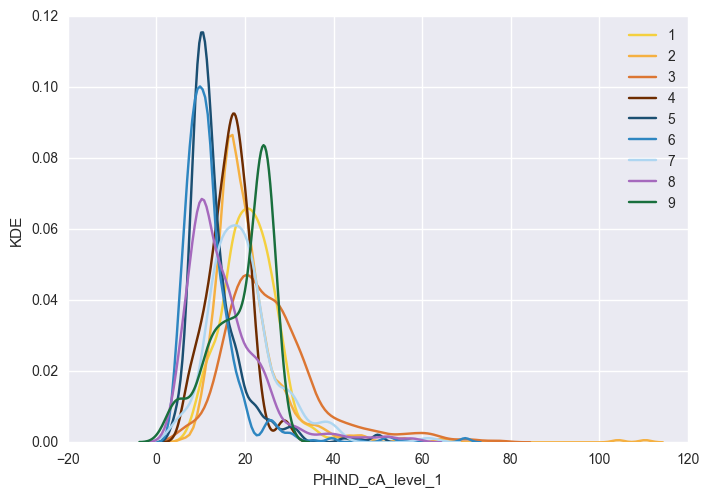

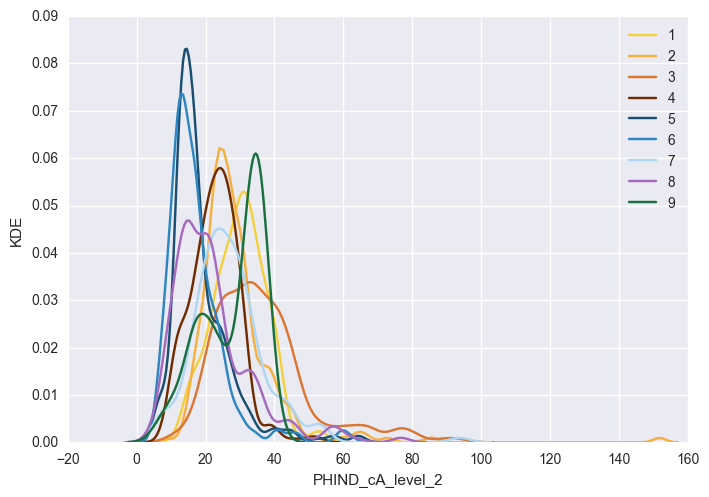

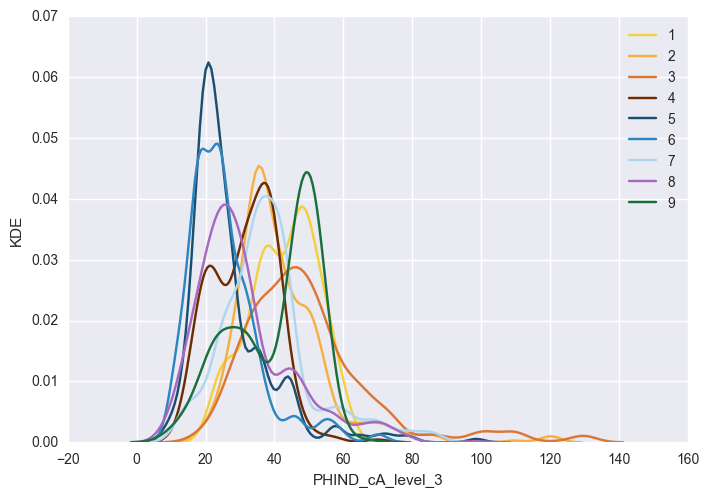

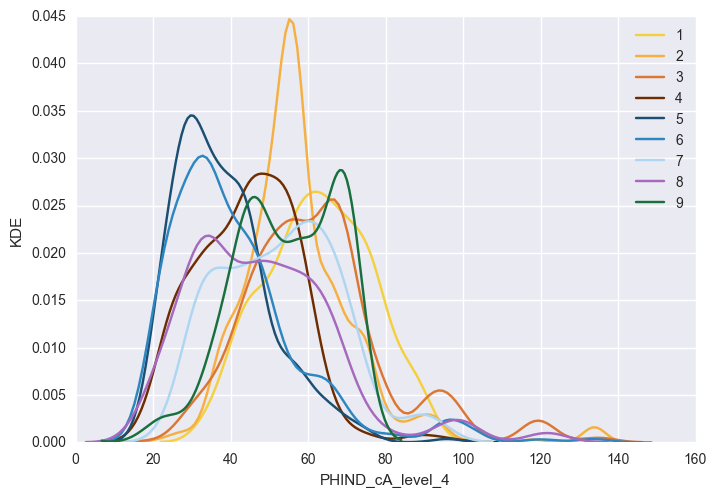

In [8]:
sns.set_palette(flatui)
list_variables = list(dwt_db1_cA_df.columns.values)
list_variables.remove('Formation')
list_variables.remove('Well Name')
list_variables.remove('Depth')
#list_variables = ['GR_cD_step_level_1', 'GR_cA_step_level_1', 'GR_cD_step_level_2', 'GR_cA_step_level_2', 'GR_cD_step_level_3', 'GR_cA_step_level_3']
for a in list_variables:
    for i in np.arange(1, 10, 1):
        sns.kdeplot(dwt_db1_cA_df[a][dwt_db1_cA_df['Facies'] == i], label=i)
    plt.xlabel(a)
    plt.ylabel('KDE')
    plt.show()